<a href="https://colab.research.google.com/github/chig/chig.github.com/blob/master/GENESIS_tutorial_3_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**GENESIS Tutorial in Google Colab.**

From "*3.3 MD simulation of Protein G in NaCl solution with the CHARMM force field*":  https://www.r-ccs.riken.jp/labs/cbrt/tutorials2019/tutorial-3-3/

and "*3.2 MD simulation of alanine-tripeptide in water with the CHARMM force field*" : https://www.r-ccs.riken.jp/labs/cbrt/tutorials2019/tutorial-3-2/


These sites are designed to be downloaded as linked tar balls and executed in your environment.

However, in this tutorial, it will be reading and analyzing output files of MD simulations that have been calculated on Fugaku beforehand.

**Preparation**

Please download material from github.

In [1]:
!git clone https://github.com/chig/genesis_tutorial_with_python.git

Cloning into 'genesis_tutorial_with_python'...
remote: Enumerating objects: 98, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 98 (delta 30), reused 81 (delta 19), pack-reused 0
Unpacking objects: 100% (98/98), done.


Please install and import py3Dmol to see molecules

In [2]:
!pip install py3Dmol
import py3Dmol

Please check if you can download data.

In [3]:
!ls

genesis_tutorial_with_python  sample_data


Inputs and outputs are in tutorial-3.3/

In [4]:
%cd genesis_tutorial_with_python/tutorial-3.3

/content/genesis_tutorial_with_python/tutorial-3.3


You can find 5 directories for steps.

In [5]:
!ls

1_setup     3_equilibrate  5_analysis
2_minimize  4_production   GENESIS_tutorial_3_3.ipynb


In this tutorial, 1_setup is skipped. To find the information, please access the original page;

https://www.r-ccs.riken.jp/labs/cbrt/tutorials2019/tutorial-3-3/#1_Setup

In [6]:
%cd 1_setup/
with open("5_ionize/ionized.pdb") as imol:
    system = "".join([x for x in imol])
view = py3Dmol.view(width=400, height=300)
view.addModelsAsFrames(system)
view.setStyle({'resn' : 'SOD'}, {'sphere': {'color': 'yellow'}})
view.setStyle({'resn': 'CLA'}, {'sphere': {'color': 'green'}})
view.setStyle({'chain': 'P'},{'cartoon': {'color': 'blue'}})
#view.setStyle({'atom': ['OH2', 'H1', 'H2']},{'sphere': {'color': 'white', 'opacity': 0.7}})
view.zoomTo()
view.show()

/content/genesis_tutorial_with_python/tutorial-3.3/1_setup


You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

First, we need to execute energy minimization to stabilize the structure.

In [7]:
%cd ../2_minimize
!ls

/content/genesis_tutorial_with_python/tutorial-3.3/2_minimize
INP  log


In [8]:
import sys
sys.path.append("../../get_genesis_log")

In [9]:
import genesislog
(x,y)=genesislog.read_genesis("log", "POTENTIAL_ENE")

We can confirm the potential energy is decreased during the minimization.

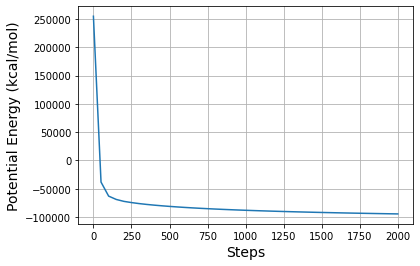

In [10]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.grid()
ax.plot(x,y)
ax.set_xlabel("Steps", size=14)
ax.set_ylabel("Potential Energy (kcal/mol)",size=14)
plt.show()

We run three simulations at equilibration step.


1.   NVT ensemble with positional restraints on protein heavy atoms
2.   NPT ensemble with positional restraints on protein heavy atoms
3.   NPT ensemble with positional restraints on protein backbone heavy atoms


In [11]:
%cd ../3_equilibrate
!ls

/content/genesis_tutorial_with_python/tutorial-3.3/3_equilibrate
INP1  INP2  INP3  log1	log2  log3


NVT ensemble with positional restraints on protein heavy atoms

In [ ]:
!cat INP1

In [13]:
(x,y)=genesislog.read_genesis("log1", "TEMPERATURE")

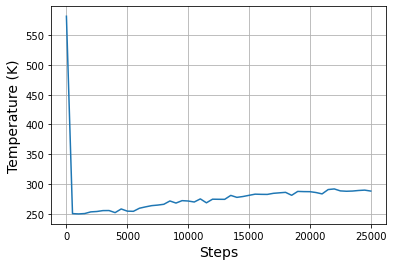

In [14]:
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.grid()
ax.plot(x,y)
ax.set_xlabel("Steps", size=14)
ax.set_ylabel("Temperature (K)",size=14)
plt.show()

NPT ensemble with positional restraints on protein heavy atoms

In [ ]:
!cat INP2

In [15]:
(x,y)=genesislog.read_genesis("log2", "BOXX")

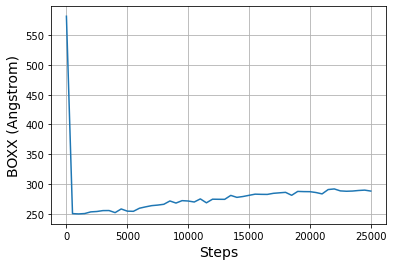

In [15]:
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.grid()
ax.plot(x,y)
ax.set_xlabel("Steps", size=14)
ax.set_ylabel("BOXX (Angstrom)",size=14)
plt.show()

NPT ensemble with positional restraints on protein backbone heavy atoms

In [ ]:
!cat INP3

In [17]:
(x,y)=genesislog.read_genesis("log3", "BOXX")

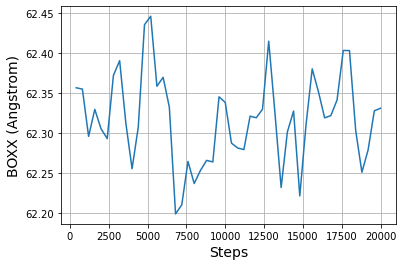

In [18]:
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.grid()
ax.plot(x,y)
ax.set_xlabel("Steps", size=14)
ax.set_ylabel("BOXX (Angstrom)",size=14)
plt.show()

Production
Since we need to execute very long simulations at the production step, we need to run simulations with different submittions.

In [19]:
%cd ../4_production/
!ls

/content/genesis_tutorial_with_python/tutorial-3.3/4_production
INP1  INP2  INP3  INP4	INP5  log1  log2  log3	log4  log5  production_last.pdb


In [ ]:
!cat INP1

After the simulations, water molecules can be spread out of the simulation box and protein can be translated and rotated.

In [20]:
with open("production_last.pdb") as imol:
    system = "".join([x for x in imol])
view = py3Dmol.view(width=400, height=300)
view = py3Dmol.view(width=400, height=300)
view.addModelsAsFrames(system)
view.setStyle({'resn' : 'SOD'}, {'sphere': {'color': 'yellow'}})
view.setStyle({'resn': 'CLA'}, {'sphere': {'color': 'green'}})
view.setStyle({'chain': 'P'},{'cartoon': {'color': 'blue'}})
view.setStyle({'atom': ['OH2', 'H1', 'H2']},{'sphere': {'color': 'white', 'opacity': 0.7}})
view.zoomTo()
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

GENESIS prepares tools to analyze trajectory files.
1. conversion of trajectories to place water molecules inside the simulation box.
2. Extract a protein molecule from the trajectories
3. Calculate RMSD

In [21]:
%cd ../5_analysis/
!ls

/content/genesis_tutorial_with_python/tutorial-3.3/5_analysis
1_crd_convert_wrap  2_crd_convert_pro  3_rmsd


In [22]:
%cd 1_crd_convert_wrap/
!ls

/content/genesis_tutorial_with_python/tutorial-3.3/5_analysis/1_crd_convert_wrap
crd_conv.log  INP  production_last_wrap.pdb


In [ ]:
!cat INP

In [23]:
with open("production_last_wrap.pdb") as imol:
    system = "".join([x for x in imol])
view = py3Dmol.view(width=400, height=300)
view = py3Dmol.view(width=400, height=300)
view.addModelsAsFrames(system)
view.setStyle({'resn' : 'SOD'}, {'sphere': {'color': 'yellow'}})
view.setStyle({'resn': 'CLA'}, {'sphere': {'color': 'green'}})
view.setStyle({'chain': 'P'},{'cartoon': {'color': 'blue'}})
view.setStyle({'atom': ['OH2', 'H1', 'H2']},{'sphere': {'color': 'white', 'opacity': 0.7}})
view.zoomTo()
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [24]:
%cd ../2_crd_convert_pro/
!ls

/content/genesis_tutorial_with_python/tutorial-3.3/5_analysis/2_crd_convert_pro
crd_conv.log  INP  production_last_protein.pdb


We can see that an protein molecule exists in 'production_last_protein.pdb'

In [27]:
with open("production_last_protein.pdb") as imol:
    system = "".join([x for x in imol])
view = py3Dmol.view(width=400, height=300)
view = py3Dmol.view(width=400, height=300)
view.addModelsAsFrames(system)
view.setStyle({'resn' : 'SOD'}, {'sphere': {'color': 'yellow'}})
view.setStyle({'resn': 'CLA'}, {'sphere': {'color': 'green'}})
view.setStyle({'chain': 'P'},{'cartoon': {'color': 'blue'}})
#view.setStyle({'atom': ['OH2', 'H1', 'H2']},{'sphere': {'color': 'white', 'opacity': 0.7}})
view.zoomTo()
view.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [28]:
%cd ../3_rmsd/
!ls

/content/genesis_tutorial_with_python/tutorial-3.3/5_analysis/3_rmsd
INP  output.rms


In [29]:
x=[]
y=[]
f = open('output.rms','r')
for line in f:
  data = line[:-1].split()
  x.append(float(data[0]))
  y.append(float(data[1]))
f.close()

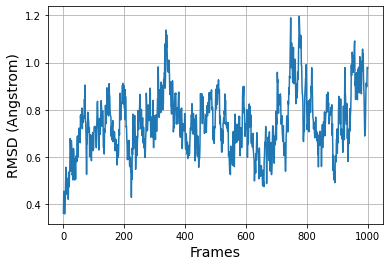

In [30]:
fig = plt.figure(figsize=(6,4))
ax = fig.add_subplot(111)
ax.grid()
ax.plot(x,y)
ax.set_xlabel("Frames", size=14)
ax.set_ylabel("RMSD (Angstrom)",size=14)
plt.show()